
# Problem Statement

## Import all required Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,accuracy_score,confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from warnings import filterwarnings
filterwarnings("ignore")

## Load the Data

In [2]:
house_df = pd.read_csv("C:\\Users\\sheetal.basalingappa\\Downloads\\PP_RE_01+-+House+Price+Prediction (1)\\innercity.csv")

## Check the data .head(),info()

In [3]:
house_df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,...,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,...,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,...,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,...,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,...,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [4]:
#Data Understanding

In [5]:
# print the number of records and features/aspects we have in the provided file
house_df.shape

(21613, 23)

We have more than 21613 records having 23 features

In [6]:
# let's check out the columns/features we have in the dataset
house_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

In [7]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

####  We can see from above that there are certain variables that are showing up as object data type even though the data in them is of numeric types. These variables are:
* <font color = 'blue'>__ceil__</font>
* <font color = 'blue'>__coast__</font>
* <font color = 'blue'>__condition__</font>
* <font color = 'blue'>__yr_built__</font>
* <font color = 'blue'>__long__</font>
* <font color = 'blue'>__total_area__</font>

#### We need to check these variables for contamination by characters.

In [8]:
l = ['ceil','coast','condition','yr_built','long','total_area']
for i in l:
    print(i.upper())
    print(house_df[i].unique())
# We can see that the above variables are contaminated by the character $

CEIL
['1' '2' '3' '1.5' '2.5' '$' nan '3.5']
COAST
['0' '1' '$' nan]
CONDITION
['3' '4' '5' '2' nan '1' '$']
YR_BUILT
['1966' '1948' '2009' '1924' '1994' '2005' '1978' '1983' '2012' '1912'
 '1990' '1967' '1919' '1908' '1950' '2000' '2013' '1943' '1922' '1977'
 '2004' '1935' '1964' '1945' '1987' '2008' '1940' '2003' '1988' '1985'
 '1998' '1995' '1946' '1984' '1958' '1963' '1942' '2014' '1971' '1936'
 '1954' '1923' '2002' '1972' '2007' '1930' '1962' '1999' '1953' '1965'
 '2010' '1997' '2006' '1979' '1996' '1992' '1968' '1980' '1981' '1969'
 '2001' '1929' '1952' '1916' '1976' '1974' '1920' '1931' '1975' '1960'
 '1900' '$' '1986' '1989' '1906' '1955' '1956' '1915' '1941' '1993' '2011'
 '1925' '1947' '1991' '1926' '1927' '1951' '1961' '1932' '1917' '1928'
 '1959' '1921' '1911' '1949' '1982' '1913' '1957' '1914' '1938' '1973'
 '1937' '1944' '1970' '1901' '1907' '1939' '1918' '1934' '1904' '2015'
 '1909' '1910' '1905' '1902' '1933' '1903' nan]
LONG
['-122.183' '-122.274' '-122.256' '-122.213'

As we checked that there are Dollar in above variables. Hence it is showing the above varaibles as Object Datatype. 

We will replace dollars by np.nan & convert the datatype. 

In [9]:
# Replacing the $ with nan so that it shows up as a missing value
house_df.replace('$',np.nan,inplace=True)

In [10]:
# Rechecking once more if any characters then.
for i in l:
    print(i.upper())
    print(house_df[i].unique())

CEIL
['1' '2' '3' '1.5' '2.5' nan '3.5']
COAST
['0' '1' nan]
CONDITION
['3' '4' '5' '2' nan '1']
YR_BUILT
['1966' '1948' '2009' '1924' '1994' '2005' '1978' '1983' '2012' '1912'
 '1990' '1967' '1919' '1908' '1950' '2000' '2013' '1943' '1922' '1977'
 '2004' '1935' '1964' '1945' '1987' '2008' '1940' '2003' '1988' '1985'
 '1998' '1995' '1946' '1984' '1958' '1963' '1942' '2014' '1971' '1936'
 '1954' '1923' '2002' '1972' '2007' '1930' '1962' '1999' '1953' '1965'
 '2010' '1997' '2006' '1979' '1996' '1992' '1968' '1980' '1981' '1969'
 '2001' '1929' '1952' '1916' '1976' '1974' '1920' '1931' '1975' '1960'
 '1900' nan '1986' '1989' '1906' '1955' '1956' '1915' '1941' '1993' '2011'
 '1925' '1947' '1991' '1926' '1927' '1951' '1961' '1932' '1917' '1928'
 '1959' '1921' '1911' '1949' '1982' '1913' '1957' '1914' '1938' '1973'
 '1937' '1944' '1970' '1901' '1907' '1939' '1918' '1934' '1904' '2015'
 '1909' '1910' '1905' '1902' '1933' '1903']
LONG
['-122.183' '-122.274' '-122.256' '-122.213' '-122.285' nan 

In [11]:
# Converting the relevant variables back into numeric form 
for i in l:
    house_df[i]=house_df[i].astype('float64')

In [12]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21541 non-null  float64
 8   coast             21582 non-null  float64
 9   sight             21556 non-null  float64
 10  condition         21528 non-null  float64
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21598 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

## Check for missing value in any column

In [13]:
# Are there any missing values ?
house_df.isnull().sum().sort_values(ascending = False)

living_measure15    166
room_bed            108
room_bath           108
condition            85
ceil                 72
total_area           68
sight                57
lot_measure          42
long                 34
coast                31
furnished            29
lot_measure15        29
living_measure       17
yr_built             15
quality               1
basement              1
ceil_measure          1
yr_renovated          0
zipcode               0
lat                   0
dayhours              0
price                 0
cid                   0
dtype: int64

In [14]:
missing_values = house_df.isna().sum().sort_values(ascending = False)

missing_values = missing_values[missing_values>0]
missing_values.sort_values(inplace=True)

Text(0.5, 1.0, 'Missing Values Per Variable')

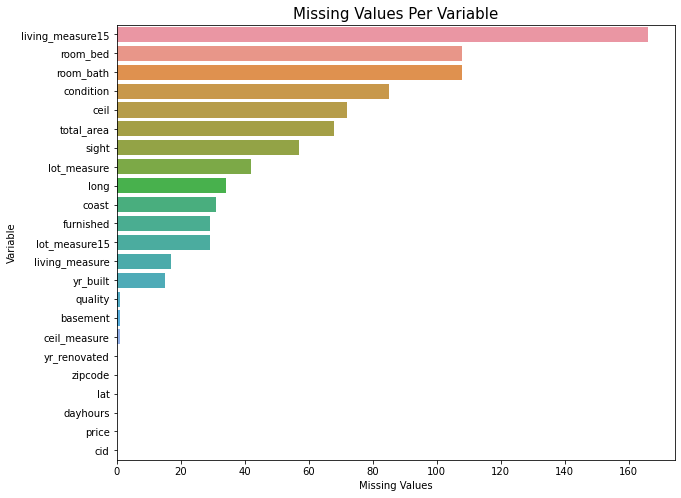

In [15]:
miss = house_df.isnull().sum().sort_values(ascending = False)
fig,axes = plt.subplots(figsize=(10,8))
sns.barplot(y = miss.index,x = miss.values,ci=0)
axes.set_xlabel("Missing Values")
axes.set_ylabel("Variable")
axes.set_title('Missing Values Per Variable',fontsize=15)

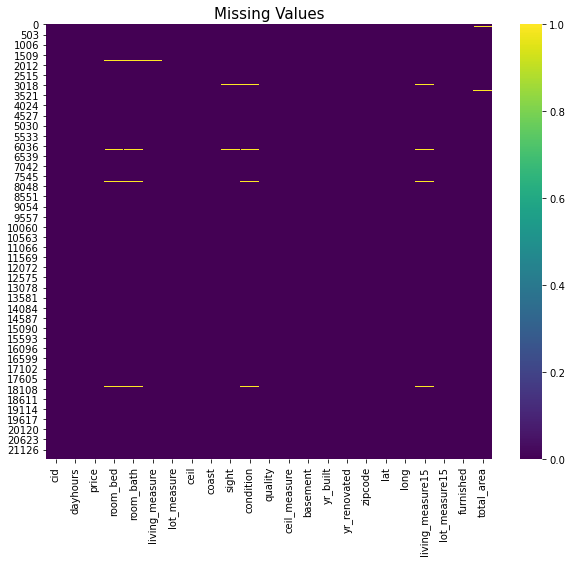

In [16]:
plt.subplots(figsize=(10,8))
sns.heatmap(house_df.isnull(), cmap='viridis')
plt.title('Missing Values', fontsize=15)
plt.show()

#### Treatment of Missing values

In [18]:
house_df['living_measure15'] = house_df['living_measure15'].fillna(house_df['living_measure15'].mode()[0]) 

In [19]:
house_df['room_bed'] = house_df['room_bed'].fillna(house_df['room_bed'].mode()[0]) 

In [20]:
house_df['room_bath'] = house_df['room_bath'].fillna(house_df['room_bath'].mode()[0]) 

In [21]:
house_df['sight'] = house_df['sight'].fillna(house_df['sight'].mode()[0]) 

In [22]:
house_df['condition'] = house_df['condition'].fillna(house_df['condition'].mode()[0]) 

In [23]:
house_df['lot_measure'] = house_df['lot_measure'].fillna(house_df['lot_measure'].mode()[0]) 

In [24]:
house_df['ceil'] = house_df['ceil'].fillna(house_df['ceil'].mode()[0]) 

In [25]:
house_df['total_area'] = house_df['total_area'].fillna(house_df['total_area'].mode()[0]) 

In [26]:
house_df['furnished'] = house_df['furnished'].fillna(house_df['furnished'].mode()[0]) 

In [27]:
house_df['lot_measure15'] = house_df['lot_measure15'].fillna(house_df['lot_measure15'].mode()[0]) 

In [28]:
house_df['living_measure'] = house_df['living_measure'].fillna(house_df['living_measure'].mode()[0]) 

In [29]:
house_df['basement'] = house_df['basement'].fillna(house_df['basement'].mode()[0]) 

In [30]:
house_df['yr_built'] = house_df['yr_built'].fillna(house_df['yr_built'].mode()[0]) 

In [31]:
house_df['quality'] = house_df['quality'].fillna(house_df['quality'].mode()[0]) 

In [32]:
house_df['ceil_measure'] = house_df['ceil_measure'].fillna(house_df['ceil_measure'].mode()[0]) 

In [33]:
house_df['coast'] = house_df['coast'].fillna(house_df['coast'].mode()[0]) 

In [34]:
house_df.isnull().sum()

cid                  0
dayhours             0
price                0
room_bed             0
room_bath            0
living_measure       0
lot_measure          0
ceil                 0
coast                0
sight                0
condition            0
quality              0
ceil_measure         0
basement             0
yr_built             0
yr_renovated         0
zipcode              0
lat                  0
long                34
living_measure15     0
lot_measure15        0
furnished            0
total_area           0
dtype: int64

In [35]:
import plotly.express as px
import pandas as pd
fig = px.scatter_geo(house_df,lat='lat',lon='long', )
fig.update_layout(title = 'lat long, 2014-2015', title_x=0.5)
fig.show()

In [36]:
# let's check whether there's any duplicate record in our dataset or not. If present, we have to remove them
house_df.duplicated().sum()

0

In [37]:
# let's do the 5 - factor analysis of the features
house_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.369500e+00,9.283307e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.117094e+00,7.688002e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079247e+03,9.183951e+02,2.900000e+02,1.420000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.508495e+04,4.138574e+04,5.200000e+02,5.032000e+03,7.606000e+03,1.066000e+04,1.651359e+06
ceil,21613.0,1.492481e+00,5.397630e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.449220e-03,8.598879e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.337482e-01,7.655206e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.407718e+00,6.499332e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


In [38]:
house_df.iloc[:, 2:].columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area'],
      dtype='object')

## Exploratory Data Analysis

In this section, we will explore the data using visualizations. This will allow us to understand the data and the relationships between variables better, which will help us build a better model.

Target Variable Distribution Our dataset contains a lot of variables, but the most important one for us to explore is the target variable. We need to understand its distribution.

### Target Variable Distribution

Text(0.5, 0.98, 'Price Variable Anaylsis')

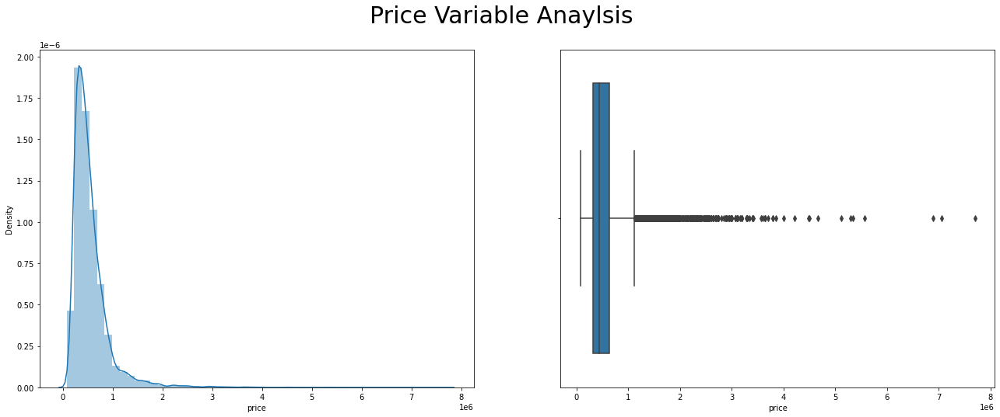

In [39]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['price'], ax=ax[0])
sns.boxplot(house_df['price'],  orient='h', ax=ax[1])
fig.suptitle("Price Variable Anaylsis", size=30)

### Let's do some visual data analysis of the features

### Univariate Analysis - By BoxPlot

#### Analyzing Feature: cid

In [40]:
cid_count=house_df.cid.value_counts()
cid_count[cid_count>1].shape

(176,)

In [41]:
cid_count.unique()

array([3, 2, 1], dtype=int64)

We have 176 properties that were sold more than once in the given data

#### Analyzing Feature: dayhours

In [42]:
house_df_o=house_df.copy()
house_df.dayhours=house_df.dayhours.str.replace('T000000', "")
house_df.dayhours=pd.to_datetime(house_df.dayhours,format='%Y%m%d')
house_df['month_year']=house_df['dayhours'].apply(lambda x: x.strftime('%B-%Y'))
house_df['month_year'].head() 

0       April-2015
1       March-2015
2      August-2014
3     October-2014
4    February-2015
Name: month_year, dtype: object

In [43]:
house_df['month_year'].value_counts()

April-2015        2231
July-2014         2211
June-2014         2180
August-2014       1940
October-2014      1878
March-2015        1875
September-2014    1774
May-2014          1768
December-2014     1471
November-2014     1411
February-2015     1250
January-2015       978
May-2015           646
Name: month_year, dtype: int64

We can see, most houses sold in April, July month.

In [44]:
house_df.groupby(['month_year'])['price'].agg('mean')

month_year
April-2015        561933.463021
August-2014       536527.039691
December-2014     524602.893270
February-2015     507919.603200
January-2015      525963.251534
July-2014         544892.161013
June-2014         558123.736239
March-2015        544057.683200
May-2014          548166.600113
May-2015          558193.095975
November-2014     522058.861800
October-2014      539127.477636
September-2014    529315.868095
Name: price, dtype: float64

So the time line of the sale data of the properties is from May-2014 to May-2015 and April month have the highest mean price.

#### Analyzing Feature: Price (Target Variable)


As a general rule of thumb: If skewness is less than -1 or greater than 1, the distribution is highly skewed. If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

Text(0.5, 0.98, 'Price Variable Anaylsis')

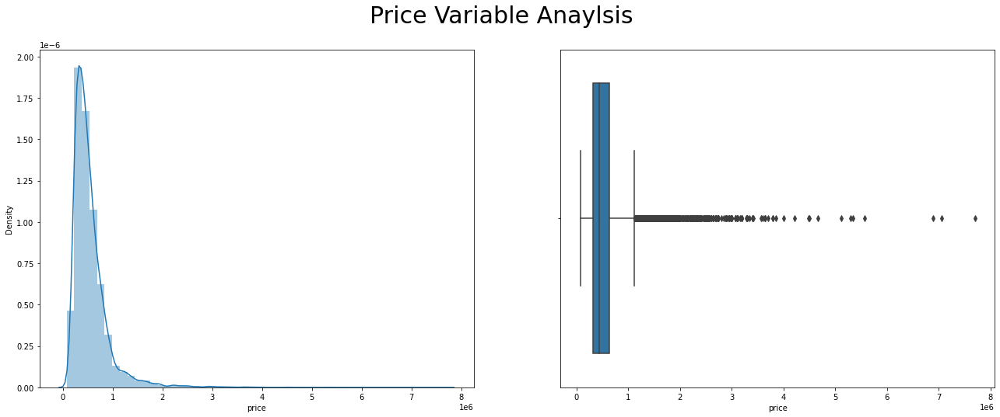

In [45]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['price'], ax=ax[0])
sns.boxplot(house_df['price'],  orient='h', ax=ax[1])
fig.suptitle("Price Variable Anaylsis", size=30)

The Price Variable distribution seems to be right-skewed.

In [46]:
house_df.price.describe()

count    2.161300e+04
mean     5.401822e+05
std      3.673622e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [47]:
#Let's look at the distribution of price at different percentiles
print("0.5% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 0.5)))
print("  1% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 1)))
print("  5% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 5)))
print(" 10% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 10)))
print(" 90% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 90)))
print(" 95% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 95)))
print(" 99% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 99)))
print("99.5% properties have a price lower than {0: .2f}".format(np.percentile(house_df["price"], 99.5)))

0.5% properties have a price lower than  133436.00
  1% properties have a price lower than  153500.36
  5% properties have a price lower than  210000.00
 10% properties have a price lower than  245000.00
 90% properties have a price lower than  887000.00
 95% properties have a price lower than  1160000.00
 99% properties have a price lower than  1968800.00
99.5% properties have a price lower than  2450000.00


#### Analyzing Feature: room_bed

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

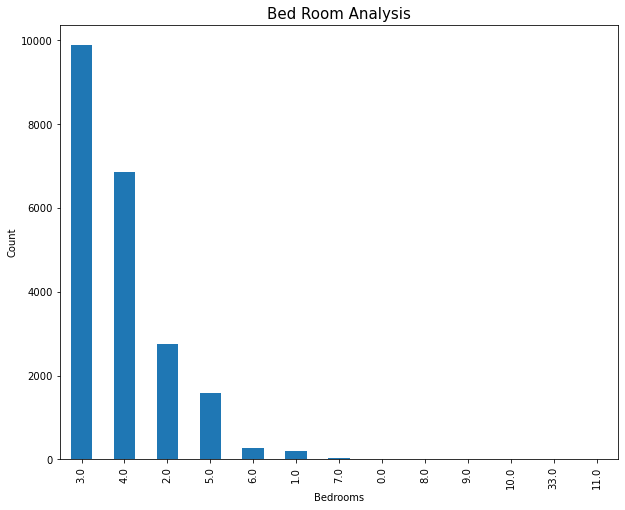

In [48]:
plt.figure(figsize=(10,8))
house_df['room_bed'].value_counts().plot(kind='bar')
plt.title('number of Bedroom')
plt.xlabel('Bedrooms')
plt.ylabel('Count')
plt.title("Bed Room Analysis", size=15)
sns.despine

In [49]:
house_df['room_bed'].value_counts()

3.0     9875
4.0     6854
2.0     2747
5.0     1595
6.0      270
1.0      197
7.0       38
0.0       13
8.0       13
9.0        6
10.0       3
33.0       1
11.0       1
Name: room_bed, dtype: int64

The value of 33 seems to be outlier we need to check the data point before imputing the same

#### Analyzing Feature: room_bath

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

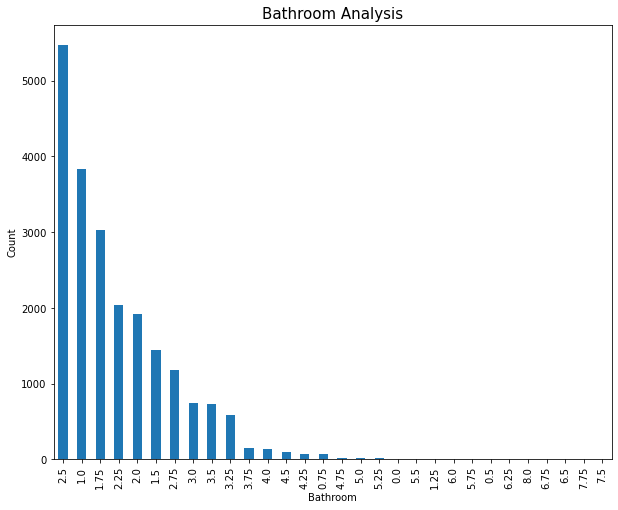

In [50]:
plt.figure(figsize=(10,8))
house_df['room_bath'].value_counts().plot(kind='bar')
plt.title('number of Bathroom')
plt.xlabel('Bathroom')
plt.ylabel('Count')
plt.title("Bathroom Analysis", size=15)
sns.despine

In [51]:
house_df[house_df['room_bath']>6]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
1068,6762700020,2014-10-13,7700000,6.0,8.00,12050.0,27600.0,2.5,0.0,3.0,...,1910.0,1987,98102,47.6298,-122.323,3940.0,8800.0,1.0,39650.0,October-2014
1222,9175600025,2014-10-07,800000,7.0,6.75,7480.0,41664.0,2.0,0.0,2.0,...,1953.0,0,98166,47.4643,-122.368,2810.0,33190.0,1.0,49144.0,October-2014
1245,1924059029,2014-06-17,4670000,5.0,6.75,9640.0,13068.0,1.0,1.0,4.0,...,1983.0,2009,98040,47.5570,-122.210,3270.0,10454.0,1.0,22708.0,June-2014
5928,424049043,2014-08-11,450000,9.0,7.50,4050.0,6504.0,2.0,0.0,0.0,...,1996.0,0,98144,47.5923,-122.301,1448.0,3866.0,0.0,10554.0,August-2014
7928,1225069038,2014-05-05,2280000,7.0,8.00,13540.0,307752.0,3.0,0.0,4.0,...,1999.0,0,98053,47.6675,-121.986,4850.0,217800.0,1.0,321292.0,May-2014
9132,424069279,2015-03-28,1180000,6.0,6.50,6260.0,10955.0,2.0,0.0,0.0,...,2007.0,0,98075,47.5947,-122.039,2710.0,12550.0,1.0,17215.0,March-2015
10639,9208900037,2014-09-19,6890000,6.0,7.75,9890.0,31374.0,2.0,0.0,4.0,...,2001.0,0,98039,47.6305,NaN,4540.0,42730.0,1.0,41264.0,September-2014
14364,2524069097,2014-05-09,2240000,5.0,6.50,7270.0,130017.0,2.0,0.0,0.0,...,2010.0,0,98027,47.5371,-121.982,1800.0,44890.0,1.0,137287.0,May-2014
20193,2303900035,2014-06-11,2890000,5.0,6.25,8670.0,64033.0,2.0,0.0,4.0,...,1965.0,2003,98177,47.7295,-122.372,4140.0,81021.0,1.0,72703.0,June-2014
20746,6072800246,2014-07-02,3300000,5.0,6.25,8020.0,21738.0,2.0,0.0,0.0,...,2001.0,0,98006,47.5675,-122.189,4160.0,18969.0,1.0,29758.0,July-2014


#### Analyzing Feature: Living measure

In [52]:
print("Skewness is :",house_df.living_measure.skew())

Skewness is : 1.473414902919285


Text(0.5, 0.98, 'Living measure Variable Anaylsis')

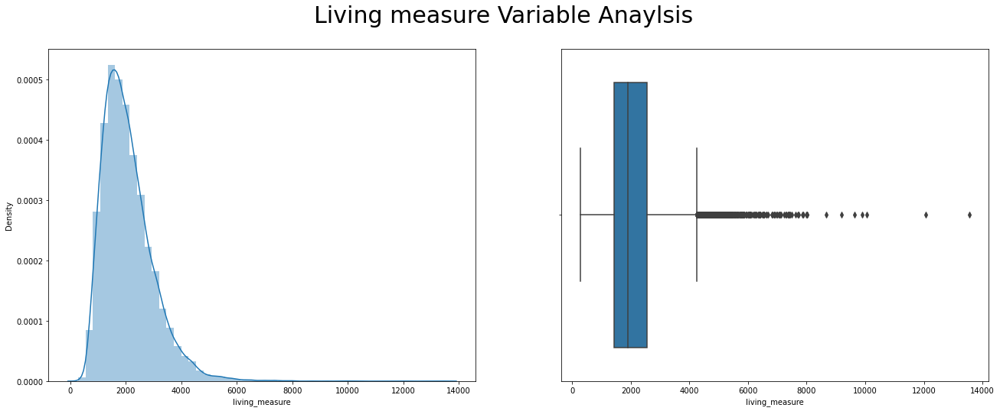

In [53]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['living_measure'], ax=ax[0])
sns.boxplot(house_df['living_measure'],  orient='h', ax=ax[1])
fig.suptitle("Living measure Variable Anaylsis", size=30)

In [54]:
house_df.living_measure.describe()

count    21613.000000
mean      2079.247351
std        918.395090
min        290.000000
25%       1420.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64

Data distribution tells us, living_measure is right-skewed. There are many outliers in living_measure. Need to review further to treat the same.

#### Analyzing Feature: lot_measure

In [55]:
print("Skewness is :",house_df.lot_measure.skew())

Skewness is : 13.084208709303645


Text(0.5, 0.98, 'lot measure Variable Anaylsis')

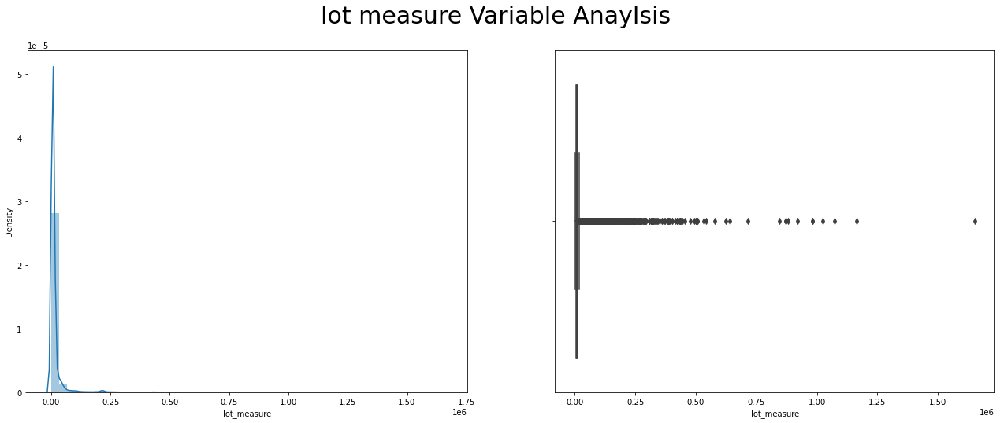

In [56]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['lot_measure'], ax=ax[0])
sns.boxplot(house_df['lot_measure'],  orient='h', ax=ax[1])
fig.suptitle("lot measure Variable Anaylsis", size=30)

In [57]:
house_df.lot_measure.describe()

count    2.161300e+04
mean     1.508495e+04
std      4.138574e+04
min      5.200000e+02
25%      5.032000e+03
50%      7.606000e+03
75%      1.066000e+04
max      1.651359e+06
Name: lot_measure, dtype: float64

There are many outliers in lot_measure. Need to review further to treat the same.

####  Analyzing Feature: ceil

In [58]:
house_df.ceil.value_counts()

1.0    10719
2.0     8210
1.5     1905
3.0      610
2.5      161
3.5        8
Name: ceil, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

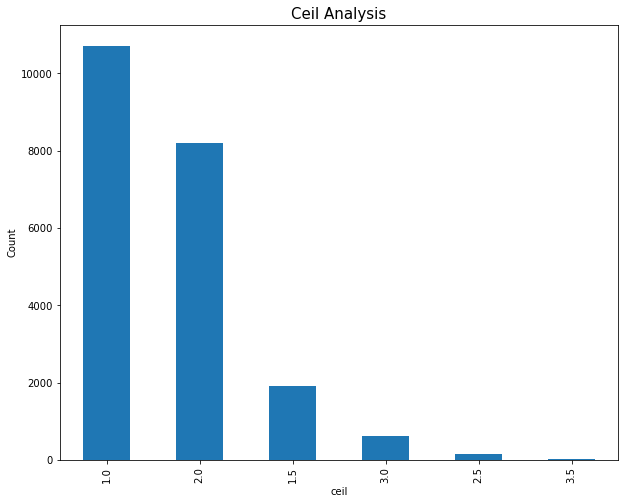

In [59]:
plt.figure(figsize=(10,8))
house_df['ceil'].value_counts().plot(kind='bar')
plt.title('ceil')
plt.xlabel('ceil')
plt.ylabel('Count')
plt.title("Ceil Analysis", size=15)
sns.despine

Basis above graph we can say that most properties have 1 and 2 floors

#### Analyzing Feature: coast

In [61]:
house_df.coast.value_counts()

0.0    21452
1.0      161
Name: coast, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

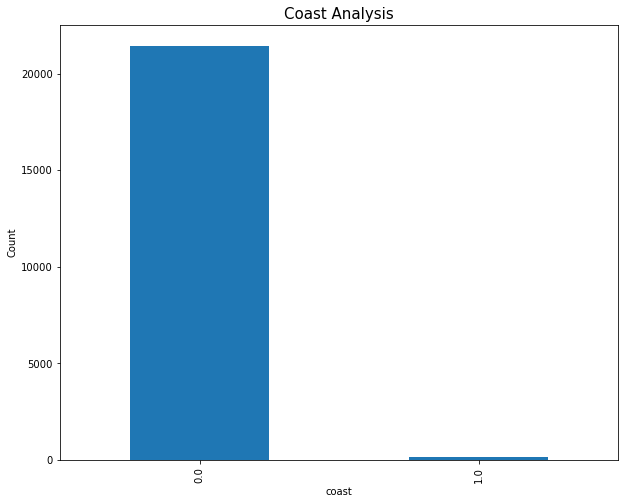

In [62]:
plt.figure(figsize=(10,8))
house_df['coast'].value_counts().plot(kind='bar')
plt.title('coast')
plt.xlabel('coast')
plt.ylabel('Count')
plt.title("Coast Analysis", size=15)
sns.despine

Most of the houses have non waterfall view.

#### Analyzing Feature: sight

In [63]:
house_df.sight.value_counts()

0.0    19494
2.0      959
3.0      510
1.0      332
4.0      318
Name: sight, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

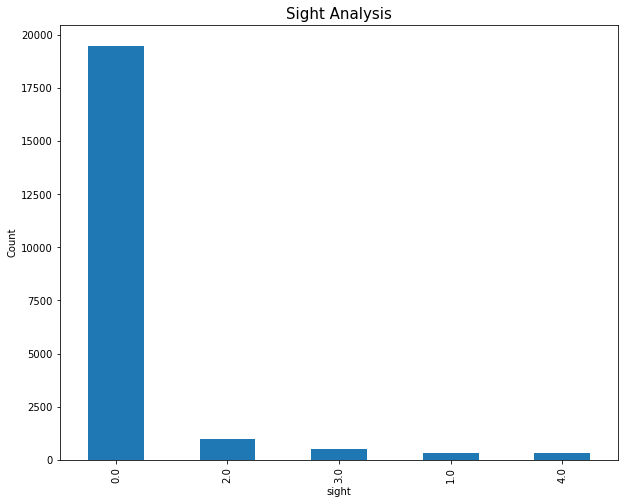

In [64]:
plt.figure(figsize=(10,8))
house_df['sight'].value_counts().plot(kind='bar')
plt.title('sight')
plt.xlabel('sight')
plt.ylabel('Count')
plt.title("Sight Analysis", size=15)
sns.despine

Most of houses are transacted without veiw the property.

#### Analyzing Feature: condition

In [65]:
house_df.condition.value_counts()

3.0    14063
4.0     5655
5.0     1694
2.0      171
1.0       30
Name: condition, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

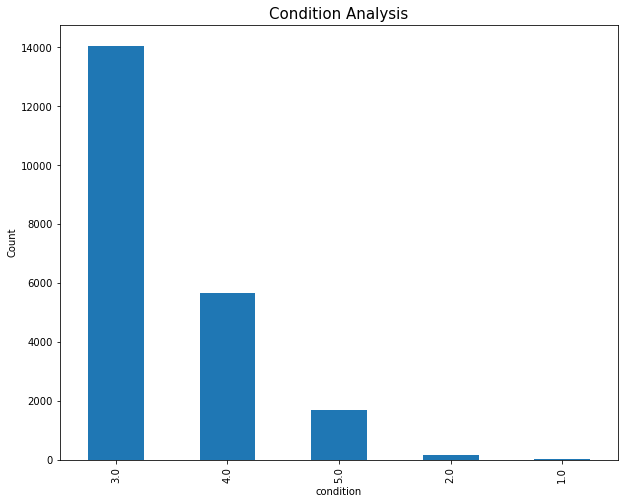

In [66]:
plt.figure(figsize=(10,8))
house_df['condition'].value_counts().plot(kind='bar')
plt.title('condition')
plt.xlabel('condition')
plt.ylabel('Count')
plt.title("Condition Analysis", size=15)
sns.despine

Basis Graph we can say that most of house are average maintained.

#### Analyzing Feature: quality

In [67]:
house_df.quality.value_counts()

7.0     8982
8.0     6067
9.0     2615
6.0     2038
10.0    1134
11.0     399
5.0      242
12.0      90
4.0       29
13.0      13
3.0        3
1.0        1
Name: quality, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

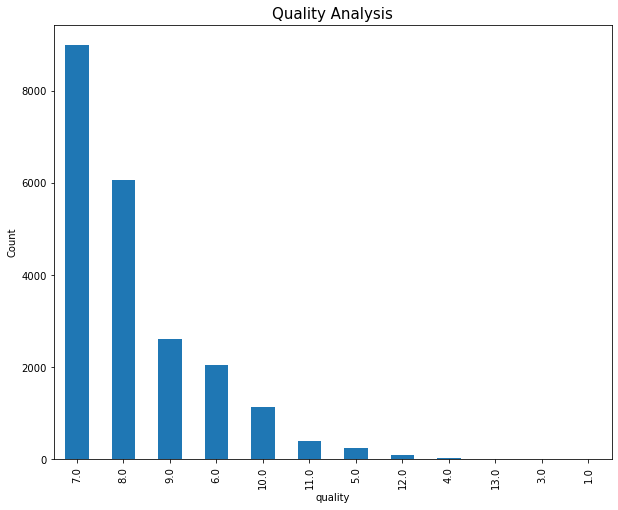

In [68]:
plt.figure(figsize=(10,8))
house_df['quality'].value_counts().plot(kind='bar')
plt.title('quality')
plt.xlabel('quality')
plt.ylabel('Count')
plt.title("Quality Analysis", size=15)
sns.despine

In [69]:
#checking the no. of data points with quality rating as 13
house_df[house_df['quality']>10]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month_year
88,3627800050,2014-07-15,1380000,5.0,4.00,3760.0,22763.0,1.0,0.0,3.0,...,1969.0,0,98040,47.5333,-122.220,3730.0,11201.0,1.0,26523.0,July-2014
125,9477580110,2014-06-26,971971,4.0,3.75,3460.0,6738.0,2.0,0.0,0.0,...,2013.0,0,98059,47.5060,-122.145,3340.0,6120.0,1.0,10198.0,June-2014
134,4141000060,2014-12-05,1230000,4.0,2.50,3180.0,10319.0,2.0,0.0,0.0,...,1986.0,0,98040,47.5372,-122.232,3130.0,12120.0,1.0,13499.0,December-2014
155,1338800425,2015-03-04,2140000,6.0,4.00,5110.0,7128.0,2.5,0.0,0.0,...,1906.0,0,98112,47.6285,-122.304,4110.0,6480.0,1.0,12238.0,March-2015
178,3023069166,2014-07-08,1140000,5.0,4.00,7320.0,217800.0,2.0,0.0,0.0,...,1992.0,0,98058,47.4473,-122.086,3270.0,34500.0,1.0,225120.0,July-2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21504,148000475,2014-05-28,1400000,4.0,3.25,4700.0,9160.0,1.0,0.0,4.0,...,2005.0,0,98116,47.5744,-122.406,2240.0,8700.0,1.0,13860.0,May-2014
21559,2579500101,2015-04-21,1390000,4.0,3.50,4010.0,10880.0,2.0,0.0,3.0,...,1990.0,0,98040,47.5359,-122.213,3530.0,17310.0,1.0,14890.0,April-2015
21564,4046600070,2014-06-19,805000,3.0,3.00,3910.0,19023.0,2.0,0.0,0.0,...,1985.0,0,98014,47.6953,-121.914,1860.0,15001.0,1.0,22933.0,June-2014
21570,6752500090,2015-01-27,1840000,4.0,3.50,4870.0,39190.0,2.0,0.0,0.0,...,1995.0,0,98006,47.5447,-122.124,5000.0,33880.0,1.0,44060.0,January-2015


There are only 494 propeties which have the highest quality rating Greater than 10. 

#### Analyzing Feature: ceil_measure

In [70]:
print("Skewness is :", house_df.ceil_measure.skew())

Skewness is : 1.4468176475402241


Text(0.5, 0.98, 'ceil_measure Variable Anaylsis')

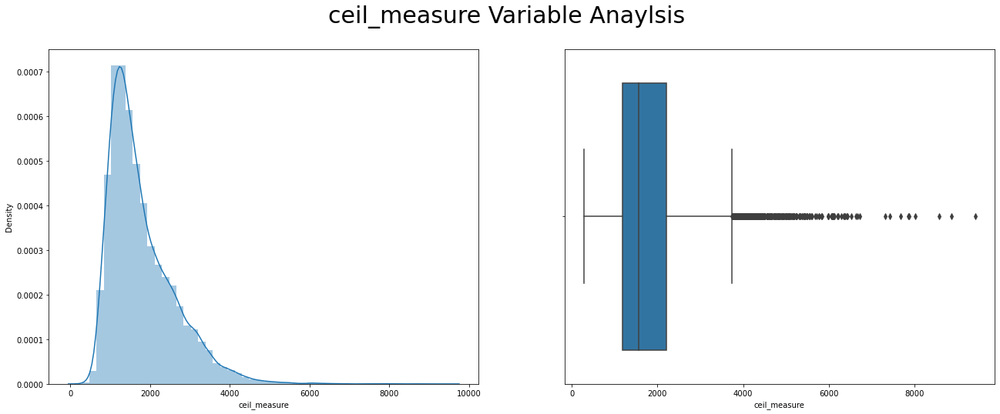

In [71]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['ceil_measure'], ax=ax[0])
sns.boxplot(house_df['ceil_measure'],  orient='h', ax=ax[1])
fig.suptitle("ceil_measure Variable Anaylsis", size=30)

The ceil_measure varaible seems to be Right skewed.

In [73]:
house_df.ceil_measure.describe()

count    21613.000000
mean      1788.343960
std        828.090039
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: ceil_measure, dtype: float64

#### Analyzing Feature: basement

Text(0.5, 0.98, 'basement Variable Anaylsis')

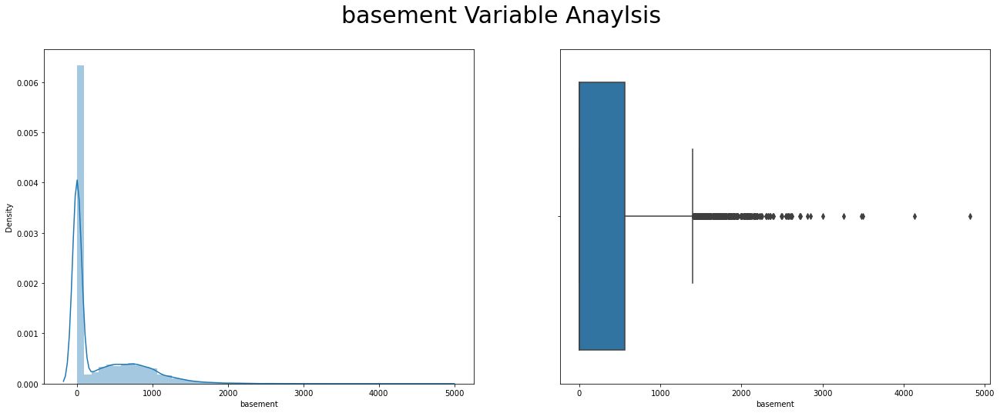

In [74]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['basement'], ax=ax[0])
sns.boxplot(house_df['basement'],  orient='h', ax=ax[1])
fig.suptitle("basement Variable Anaylsis", size=30)

In [75]:
house_df[house_df.basement==0].shape

(13126, 24)

In [76]:
house_df[house_df.basement>0].shape

(8487, 24)

We have most of properties without basement. Also We can clearly see, there are outliers. Need to check.

#### Analyzing Feature: yr_built

In [78]:
house_df['yr_built'].value_counts()

2014.0    574
2006.0    454
2005.0    450
2004.0    433
2003.0    421
         ... 
1933.0     30
1901.0     29
1902.0     27
1935.0     24
1934.0     21
Name: yr_built, Length: 116, dtype: int64

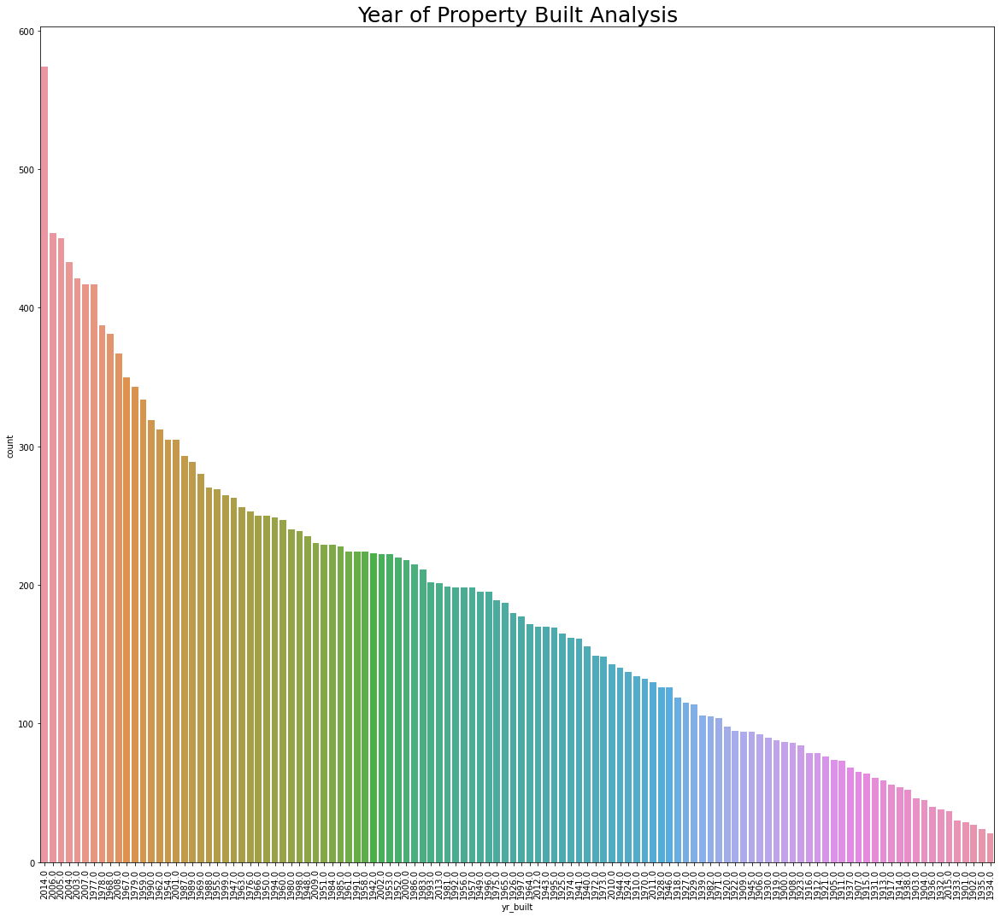

In [79]:
fig,axes = plt.subplots(figsize=(20,18))
sns.countplot(house_df['yr_built'],order = house_df['yr_built'].value_counts().index)
axes.set_xticklabels(house_df['yr_built'].value_counts().index,rotation=90)
plt.title("Year of Property Built Analysis", size=25)
plt.show()

The built year of the properties range from 1900 to 2014 and we can see upward trend with time

#### Analyzing Feature: yr_renovated

In [80]:
house_df.yr_renovated.value_counts()

0       20699
2014       91
2013       37
2003       36
2007       35
        ...  
1948        1
1954        1
1951        1
1944        1
1959        1
Name: yr_renovated, Length: 70, dtype: int64

We can see that there are many properties which are not renovated.

In [81]:
house_df[house_df['yr_renovated']>0].shape

(914, 24)

Only 893 houses were renovated out of 21288 houses

Text(0.5, 1.0, 'Year of Property Renovated Analysis')

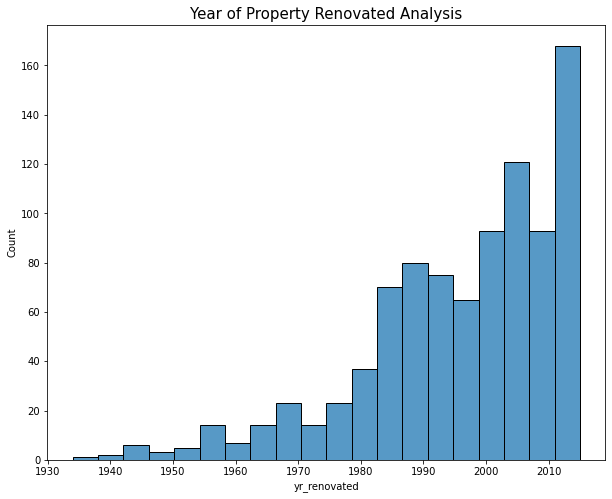

In [84]:
house_df_reno=house_df[house_df['yr_renovated']>0]
plt.figure(figsize=(10, 8))
sns.histplot(house_df_reno.yr_renovated)
plt.title("Year of Property Renovated Analysis", size=15)

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

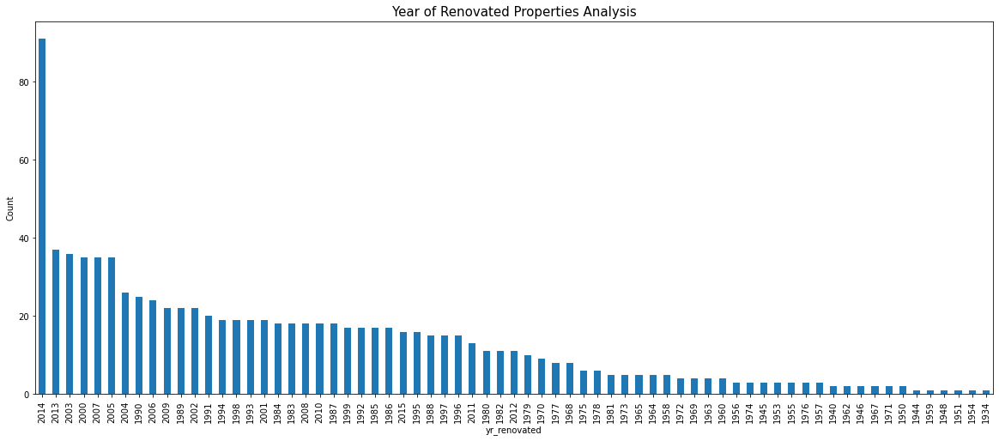

In [86]:
house_df_reno=house_df[house_df['yr_renovated']>0]
plt.figure(figsize=(20,8))
house_df_reno['yr_renovated'].value_counts().plot(kind='bar')
plt.title('yr_renovated')
plt.xlabel('yr_renovated')
plt.ylabel('Count')
plt.title("Year of Renovated Properties Analysis", size=15)
sns.despine

#### Analyzing Feature: zipcode

In [88]:
house_df['zipcode'].unique()

array([98034, 98118, 98002, 98030, 98103, 98006, 98042, 98031, 98065,
       98109, 98058, 98001, 98105, 98115, 98032, 98033, 98199, 98053,
       98056, 98102, 98038, 98092, 98003, 98075, 98059, 98008, 98011,
       98014, 98023, 98116, 98198, 98126, 98052, 98108, 98133, 98074,
       98077, 98106, 98045, 98146, 98155, 98117, 98027, 98040, 98072,
       98005, 98055, 98070, 98028, 98166, 98019, 98136, 98107, 98004,
       98125, 98112, 98024, 98177, 98122, 98168, 98029, 98007, 98178,
       98010, 98188, 98039, 98144, 98022, 98148, 98119], dtype=int64)

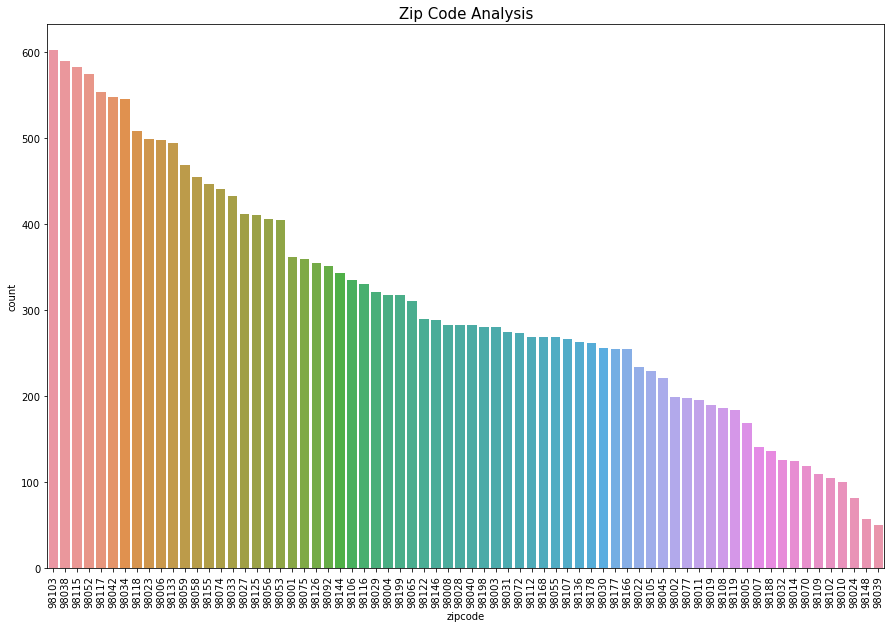

In [89]:
fig,axes = plt.subplots(figsize=(15,10))
sns.countplot(house_df['zipcode'],order = house_df['zipcode'].value_counts().index)
axes.set_xticklabels(house_df['zipcode'].value_counts().index,rotation=90)
plt.title("Zip Code Analysis", size=15)
plt.show()

#### Analyzing Feature: furnished

In [114]:
house_df.furnished.value_counts()

0.0    17367
1.0     4246
Name: furnished, dtype: int64

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

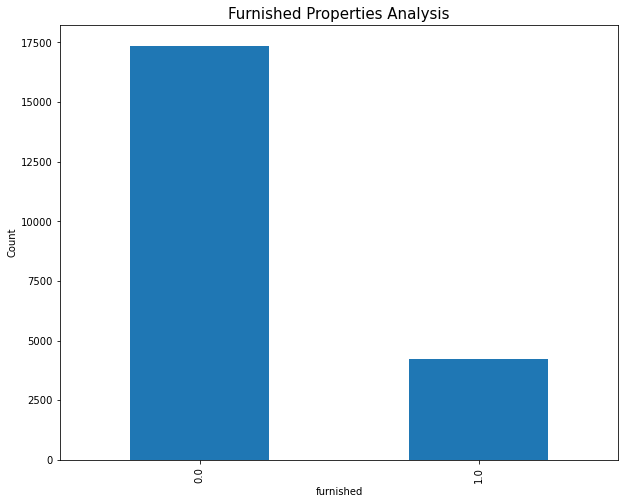

In [115]:
plt.figure(figsize=(10,8))
house_df['furnished'].value_counts().plot(kind='bar')
plt.title('furnished')
plt.xlabel('furnished')
plt.ylabel('Count')
plt.title("Furnished Properties Analysis", size=15)
sns.despine

Most properties are not furnished. furnished column need to be converted into categorical column

#### Analyzing Feature: total_area

In [116]:
print("Skewness is :",house_df.total_area.skew())

Skewness is : 12.972960285142854


Text(0.5, 0.98, 'Total Area Variable Anaylsis')

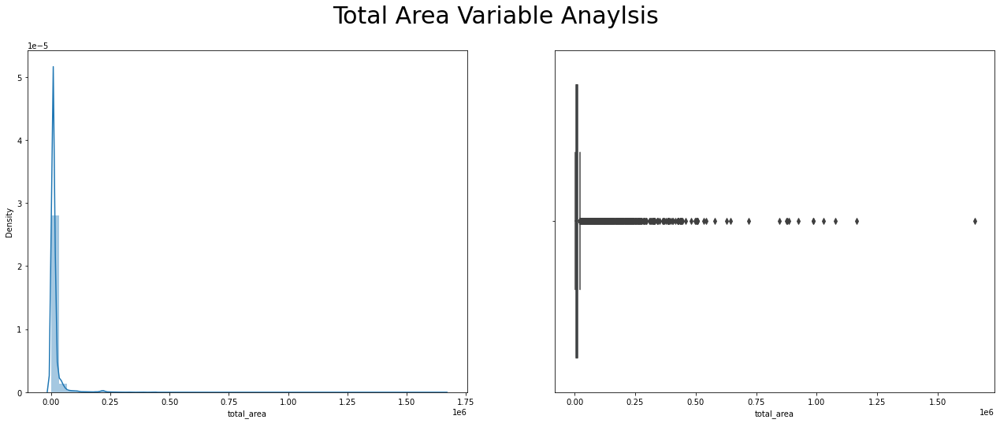

In [117]:
fig_dims = (22, 8)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=fig_dims)
sns.distplot(house_df['total_area'], ax=ax[0])
sns.boxplot(house_df['total_area'],  orient='h', ax=ax[1])
fig.suptitle("Total Area Variable Anaylsis", size=30)

In [118]:
house_df.total_area.describe()

count    2.161300e+04
mean     1.715664e+04
std      4.156792e+04
min      1.423000e+03
25%      7.010000e+03
50%      9.557000e+03
75%      1.297000e+04
max      1.652659e+06
Name: total_area, dtype: float64

### Bi-Variate Analysis on Price Variable

#### PairPlot

<Figure size 1440x432 with 0 Axes>

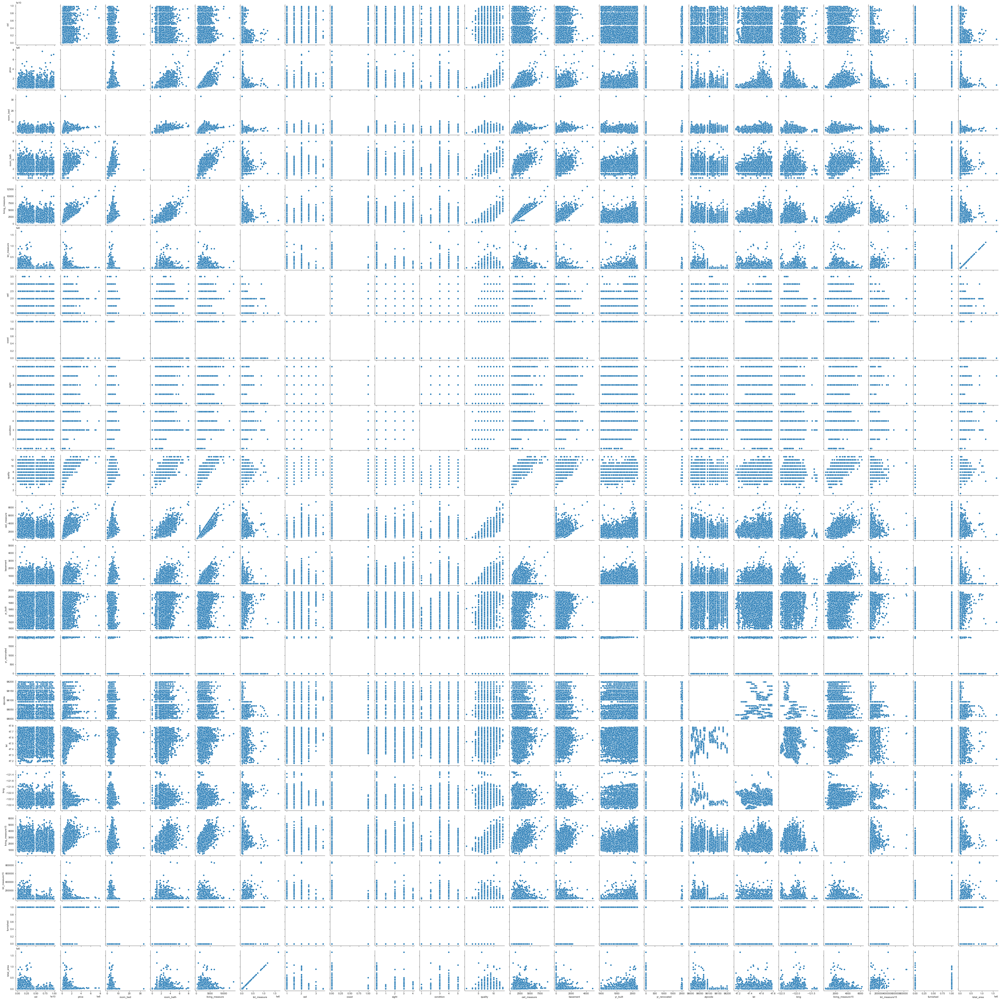

In [123]:
plt.figure(figsize=(20,6))
sns.set_style('white')
sns.set_style('ticks')
sns.pairplot(house_df, diag_kind='reg')

In [124]:
# let's see correlation between the different features
house_corr = house_df.corr(method ='pearson')
house_corr

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
cid,1.000000,-0.016797,0.001492,0.005991,-0.012240,-0.131747,0.019379,-0.004184,0.011776,-0.024273,...,-0.005151,0.021586,-0.016907,-0.008224,-0.001891,0.020898,-0.003687,-0.138713,-0.010099,-0.131673
price,-0.016797,1.000000,0.307766,0.524081,0.701913,0.089681,0.256385,0.266042,0.396999,0.035556,...,0.323837,0.053541,0.126442,-0.053168,0.306919,0.021786,0.583086,0.082604,0.565834,0.104851
room_bed,0.001492,0.307766,1.000000,0.514256,0.575828,0.032011,0.174115,-0.006080,0.078215,0.027836,...,0.301896,0.153670,0.018437,-0.152556,-0.009410,0.129943,0.389903,0.029401,0.258431,0.044449
room_bath,0.005991,0.524081,0.514256,1.000000,0.752058,0.087566,0.496180,0.061872,0.185854,-0.126503,...,0.282460,0.504725,0.050342,-0.203312,0.024818,0.222479,0.563913,0.086683,0.483371,0.103797
living_measure,-0.012240,0.701913,0.575828,0.752058,1.000000,0.172689,0.352734,0.102560,0.284288,-0.059032,...,0.434640,0.317159,0.055154,-0.199577,0.052659,0.240753,0.752584,0.183499,0.632137,0.194138
lot_measure,-0.131747,0.089681,0.032011,0.087566,0.172689,1.000000,-0.005297,0.021143,0.074968,-0.008531,...,0.015358,0.052734,0.007639,-0.129231,-0.085902,0.228875,0.144837,0.715986,0.119182,0.998087
ceil,0.019379,0.256385,0.174115,0.496180,0.352734,-0.005297,1.000000,0.024136,0.028945,-0.262111,...,-0.244864,0.486468,0.005351,-0.058419,0.050372,0.124916,0.277406,-0.011386,0.347236,0.002375
coast,-0.004184,0.266042,-0.006080,0.061872,0.102560,0.021143,0.024136,1.000000,0.400220,0.017683,...,0.079239,-0.025917,0.088358,0.030289,-0.014139,-0.042037,0.086388,0.030738,0.069571,0.023382
sight,0.011776,0.396999,0.078215,0.185854,0.284288,0.074968,0.028945,0.400220,1.000000,0.046519,...,0.277243,-0.052804,0.102980,0.084386,0.006001,-0.078125,0.281213,0.073016,0.219898,0.081035
condition,-0.024273,0.035556,0.027836,-0.126503,-0.059032,-0.008531,-0.262111,0.017683,0.046519,1.000000,...,0.173736,-0.360446,-0.060494,0.003040,-0.015471,-0.106703,-0.091782,-0.002926,-0.122410,-0.009795


Text(0.5, 1.0, 'Correlation Matrix')

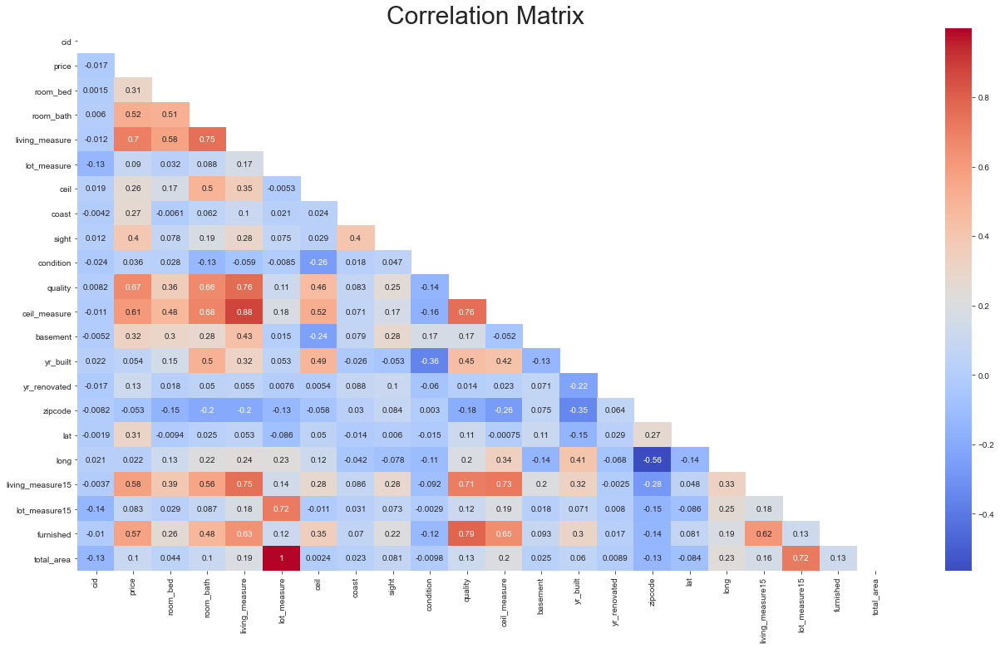

In [125]:
# Plotting heatmap
plt.subplots(figsize =(22, 12)) 
sns.heatmap(house_corr,cmap="coolwarm",annot=True, mask = np.triu(np.ones_like(house_corr, dtype=bool)))
plt.title("Correlation Matrix", size=30)

We have linear relationships in featues as we got to know from above Heat map.

Text(0.5, 1.0, 'Correlation with Price Variable')

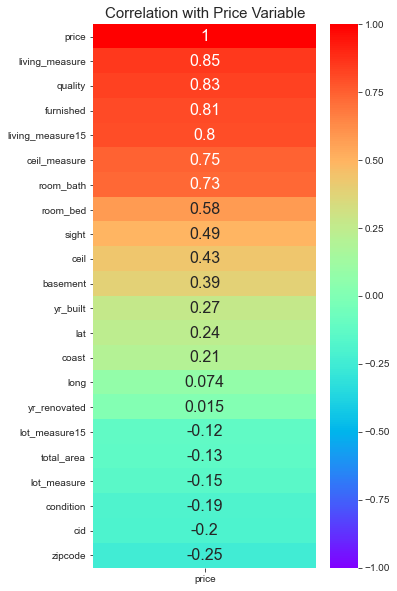

In [127]:
top_features = house_corr.corr()[['price']].sort_values(by=['price'],ascending=False).head(30)
plt.figure(figsize=(5,10))
sns.heatmap(top_features,cmap='rainbow',annot=True,annot_kws={"size": 16},vmin=-1)
plt.title("Correlation with Price Variable", size=15)

In [129]:
# list of numerical variables
numerical_features = [feature for feature in house_df.columns if house_df[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
house_df[numerical_features].head()

Number of numerical variables:  23


,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,2015-04-27,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,...,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0
1,3145600250,2015-03-17,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,...,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0
2,7129303070,2014-08-20,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,...,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0
3,7338220280,2014-10-10,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,...,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0
4,7950300670,2015-02-18,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,...,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0


In [130]:
## Numerical variables are usually of 2 type
## Continous variable and Discrete Variables

discrete_feature=[feature for feature in numerical_features if len(house_df[feature].unique())<30]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 7


In [131]:
discrete_feature

['room_bed', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished']

In [133]:
house_df[discrete_feature].head()

,room_bed,ceil,coast,sight,condition,quality,furnished
0,4.0,1.0,0.0,0.0,3.0,8.0,0.0
1,2.0,1.0,0.0,0.0,4.0,6.0,0.0
2,4.0,2.0,1.0,4.0,3.0,8.0,0.0
3,3.0,2.0,0.0,0.0,3.0,8.0,0.0
4,2.0,1.0,0.0,0.0,3.0,7.0,0.0


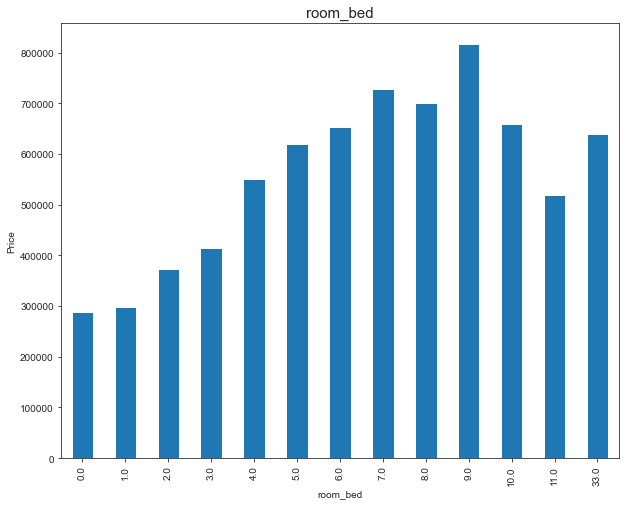

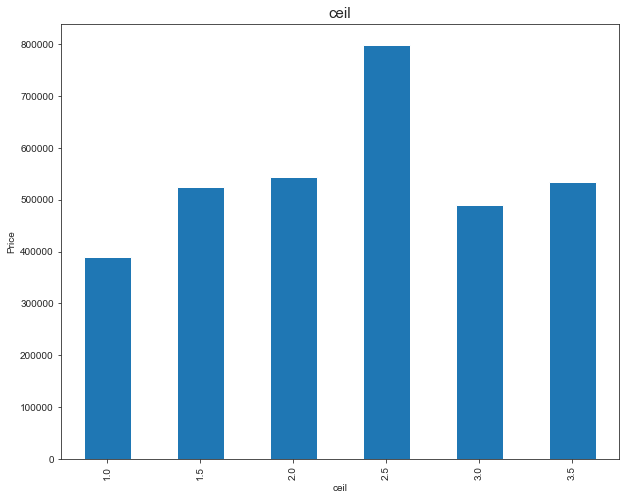

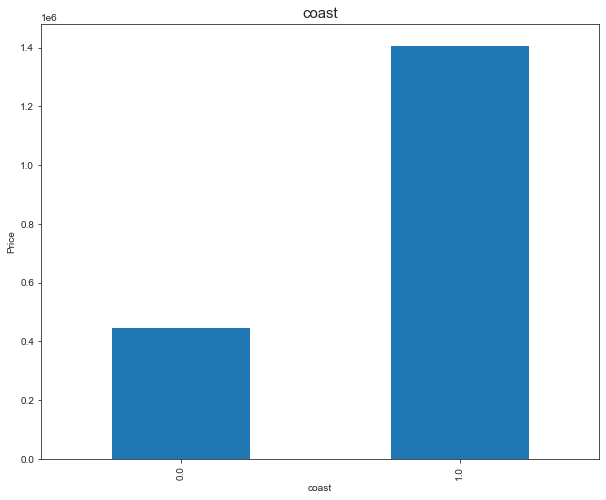

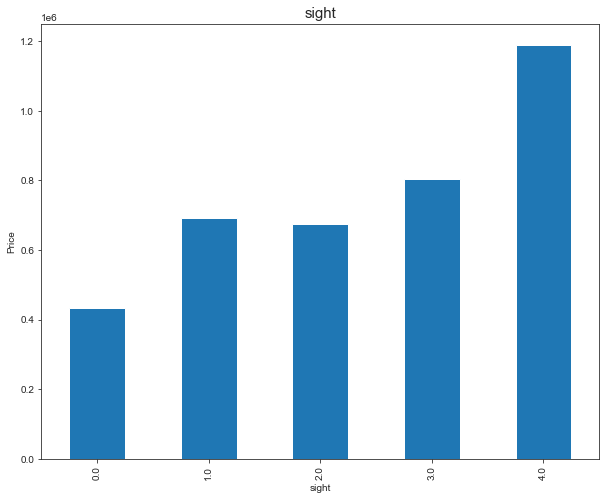

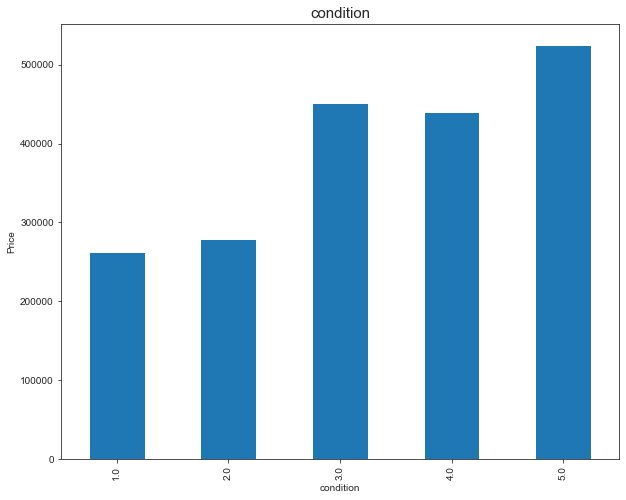

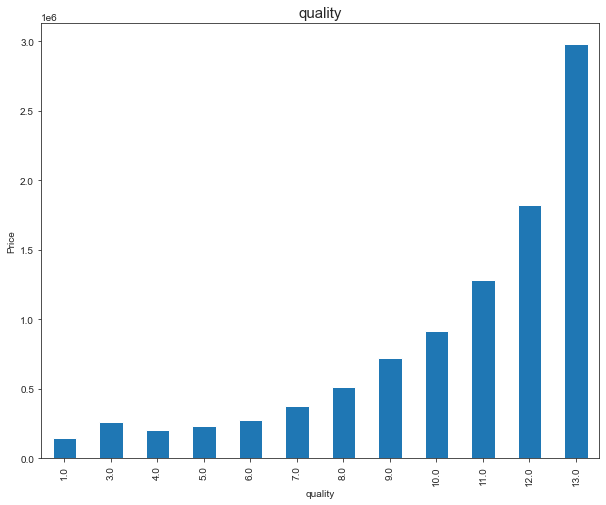

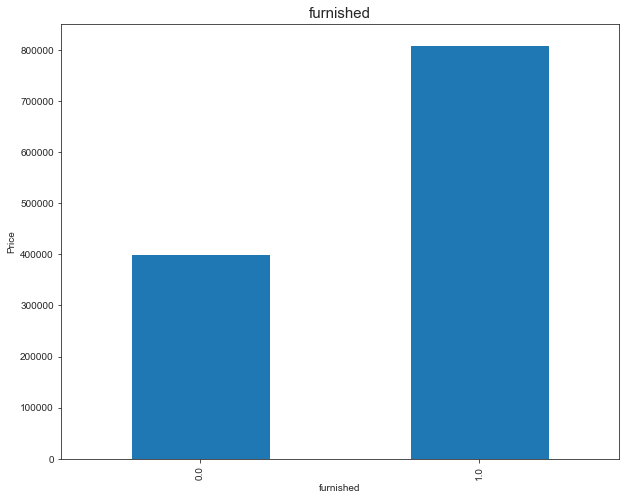

In [134]:
## Lets Find the relationship between discrete_feature and PRice

for feature in discrete_feature:
    data=house_df.copy()
    plt.figure(figsize=(10,8))
    data.groupby(feature)['price'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('Price')
    plt.title(feature, size=15)
    plt.show()

In [ ]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count {}".format(len(continuous_feature)))